<a href="https://colab.research.google.com/github/yushendye/AerialInspection/blob/main/TT_PLA_Dataset_PP_YOLO_2_27_Sept.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!git clone https://github.com/R3ab/ttpla_dataset.git

Cloning into 'ttpla_dataset'...
remote: Enumerating objects: 209, done.
remote: Counting objects: 100% (209/209), done.
remote: Compressing objects: 100% (192/192), done.
remote: Total 209 (delta 77), reused 78 (delta 17), pack-reused 0
Receiving objects: 100% (209/209), 49.88 MiB | 19.75 MiB/s, done.
Resolving deltas: 100% (77/77), done.


In [3]:
!cp /content/drive/MyDrive/data_original_size_v1.zip /content/

In [4]:
!sudo apt-get install p7zip-full

Reading package lists... Done
Building dependency tree       
Reading state information... Done
p7zip-full is already the newest version (16.02+dfsg-6).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.


In [5]:
!7z e /content/data_original_size_v1.zip


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.30GHz (306F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/                   1 file, 4510541945 bytes (4302 MiB)

Extracting archive: /content/data_original_size_v1.zip
 10% 256 Open              30% 768 Open              51% 1280 Open              
ERRORS:
Headers Error

--
Path = /content/data_original_size_v1.zip
Type = zip
ERRORS:
Headers Error
Physical Size = 4510541945
64-bit = +

  0%      0% 4 - data_original_size_v1/data_original_size/04_3420.json                                                                0% 8 - data_original_size_v1/data_

In [6]:
!mkdir /content/TTPLA_Images/
!mv *.jpg /content/TTPLA_Images/
!mv *.json /content/TTPLA_Images/

In [7]:
!rmdir /content/sized_data
%cd /content/
!python /content/ttpla_dataset/scripts/resize_image_and_annotation-final.py -t /content/TTPLA_Images

rmdir: failed to remove '/content/sized_data': No such file or directory
/content
/content/TTPLA_Images/25_00585.json 3840 2160  Resizing
/content/TTPLA_Images/44_01231.json 3840 2160  Resizing
/content/TTPLA_Images/59_00251.json 3840 2160  Resizing
/content/TTPLA_Images/22_00208.json 3840 2160  Resizing
/content/TTPLA_Images/23_00901.json 3840 2160  Resizing
/content/TTPLA_Images/52_00516.json 3840 2160  Resizing
/content/TTPLA_Images/90_5805.json 3840 2160  Resizing
/content/TTPLA_Images/33_9525.json 3840 2160  Resizing
/content/TTPLA_Images/42_00541.json 3840 2160  Resizing
/content/TTPLA_Images/7_00428.json 3840 2160  Resizing
/content/TTPLA_Images/19_00764.json 3840 2160  Resizing
/content/TTPLA_Images/39_00211.json 3840 2160  Resizing
/content/TTPLA_Images/44_01181.json 3840 2160  Resizing
/content/TTPLA_Images/22_02021.json 3840 2160  Resizing
/content/TTPLA_Images/67_01841.json 3840 2160  Resizing
/content/TTPLA_Images/58_00986.json 3840 2160  Resizing
/content/TTPLA_Images/34_

In [8]:
%cd /content/
!rm -rf /content/newjsons
!python /content/ttpla_dataset/scripts/remove_void.py -t /content/sized_data

/content
remove 0 voids from 33_00383.json and saving the new file to newjsons/33_00383.json
remove 0 voids from 70_00412.json and saving the new file to newjsons/70_00412.json
remove 0 voids from 35_00091.json and saving the new file to newjsons/35_00091.json
remove 0 voids from 67_00356.json and saving the new file to newjsons/67_00356.json
remove 0 voids from 105_2265.json and saving the new file to newjsons/105_2265.json
remove 0 voids from 33_7320.json and saving the new file to newjsons/33_7320.json
remove 0 voids from 42_00371.json and saving the new file to newjsons/42_00371.json
remove 0 voids from 76_3705.json and saving the new file to newjsons/76_3705.json
remove 0 voids from 16_3645.json and saving the new file to newjsons/16_3645.json
remove 0 voids from 58_00511.json and saving the new file to newjsons/58_00511.json
remove 0 voids from 59_01246.json and saving the new file to newjsons/59_01246.json
remove 0 voids from 41_00531.json and saving the new file to newjsons/41_

In [ ]:
%cd /content/ttpla_dataset/splitting_dataset_txt/
!python /content/ttpla_dataset/scripts/split_jsons.py -t /content/newjsons/

In [ ]:
%cd /content/
!pip install labelme
!python /content/ttpla_dataset/scripts/labelme2coco_2.py /content/newjsons/

/content
     |████████████████████████████████| 1.5 MB 5.4 MB/s 
     |████████████████████████████████| 7.7 MB 12.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 68.3 MB 37 kB/s 
     |████████████████████████████████| 317 kB 32.4 MB/s 
  Created wheel for labelme: filename=labelme-4.5.10-py3-none-any.whl size=1465507 sha256=7783338bb3502e4f5bd69e786250d1b72c98925afffc99fa13e1666284f12abf
  Stored in directory: /root/.cache/pip/wheels/25/9f/92/6c1b4e3a564cd1950878af4ebb552bbb04b6f86111b747af13
  Created wheel for imgviz: filename=imgviz-1.2.6-py3-none-any.whl size=7674115 sha256=8d20f3365806089a8ee7af5e45b21b2ef6f44af936db1449c6d1267f860755ed
  Stored in directory: /root/.cache/pip/wheels/e6/64/f9/a28eca2133ece5f072f51282577f2f9b7d6d0492eb3d2104dd
Successfully built labelme imgviz
1242
save coco json
{'cable': 0, 'tower_lattice': 1, 'tower_tucohy': 2, 'tower_w

In [ ]:
#train jsons
!python /content/ttpla_dataset/scripts/labelme2coco_2.py /content/ttpla_dataset/splitting_dataset_txt/splitting_jsons/train_jsons

905
save coco json
{'cable': 0, 'tower_lattice': 1, 'tower_tucohy': 2, 'tower_wooden': 3}
['cable', 'tower_lattice', 'tower_tucohy', 'tower_wooden']
Label with ids =  {'cable': 0, 'tower_lattice': 1, 'tower_tucohy': 2, 'tower_wooden': 3}
trainval.json


In [ ]:
#test json
!python /content/ttpla_dataset/scripts/labelme2coco_2.py /content/ttpla_dataset/splitting_dataset_txt/splitting_jsons/test_jsons

220
save coco json
{'cable': 0, 'tower_lattice': 1, 'tower_tucohy': 2, 'tower_wooden': 3}
['cable', 'tower_lattice', 'tower_tucohy', 'tower_wooden']
Label with ids =  {'cable': 0, 'tower_lattice': 1, 'tower_tucohy': 2, 'tower_wooden': 3}
trainval.json


In [ ]:
#valid json
!python /content/ttpla_dataset/scripts/labelme2coco_2.py /content/ttpla_dataset/splitting_dataset_txt/splitting_jsons/val_jsons

109
save coco json
{'cable': 0, 'tower_lattice': 1, 'tower_tucohy': 2, 'tower_wooden': 3}
['cable', 'tower_lattice', 'tower_tucohy', 'tower_wooden']
Label with ids =  {'cable': 0, 'tower_lattice': 1, 'tower_tucohy': 2, 'tower_wooden': 3}
trainval.json


In [9]:
!python -m pip install paddlepaddle-gpu==2.1.0.post101 -f https://paddlepaddle.org.cn/whl/mkl/stable.html

Looking in links: https://paddlepaddle.org.cn/whl/mkl/stable.html
     |████████████████████████████████| 344.9 MB 10 kB/s 


In [10]:
#exit(0)
import paddle
paddle.utils.run_check()

Running verify PaddlePaddle program ... 
PaddlePaddle works well on 1 GPU.
PaddlePaddle works well on 1 GPUs.
PaddlePaddle is installed successfully! Let's start deep learning with PaddlePaddle now.


In [11]:
!python -c "import paddle; print(paddle.__version__)"

2.1.0


In [12]:
!pip install paddledet==2.1.0 -i https://mirror.baidu.com/pypi/simple

Looking in indexes: https://mirror.baidu.com/pypi/simple
     |████████████████████████████████| 416 kB 1.8 MB/s 
     |████████████████████████████████| 2.7 MB 12.4 MB/s 
     |████████████████████████████████| 151 kB 24.2 MB/s 
     |████████████████████████████████| 1.5 MB 14.3 MB/s 
     |████████████████████████████████| 73 kB 1.6 MB/s 
     |████████████████████████████████| 197 kB 29.6 MB/s 
     |████████████████████████████████| 191 kB 32.8 MB/s 
     |████████████████████████████████| 2.0 MB 15.2 MB/s 
     |████████████████████████████████| 68 kB 5.5 MB/s 
     |████████████████████████████████| 41 kB 537 kB/s 
     |████████████████████████████████| 1.9 MB 13.8 MB/s 
     |████████████████████████████████| 50 kB 4.8 MB/s 
     |████████████████████████████████| 5.3 MB 14.7 MB/s 
     |████████████████████████████████| 98 kB 6.9 MB/s 
     |████████████████████████████████| 636 kB 23.7 MB/s 
     |████████████████████████████████| 496 kB 15.1 MB/s 
     |████████████████████

In [13]:
%cd /content/
!rm -rf /content/PaddleDetection/
!git clone https://github.com/PaddlePaddle/PaddleDetection.git

/content
Cloning into 'PaddleDetection'...
remote: Enumerating objects: 16471, done.
remote: Counting objects: 100% (1698/1698), done.
remote: Compressing objects: 100% (682/682), done.
remote: Total 16471 (delta 1123), reused 1424 (delta 1011), pack-reused 14773
Receiving objects: 100% (16471/16471), 141.84 MiB | 25.60 MiB/s, done.
Resolving deltas: 100% (11778/11778), done.


In [14]:
%cd /content/PaddleDetection
!python setup.py install

/content/PaddleDetection
running install
running bdist_egg
running egg_info
creating paddledet.egg-info
writing paddledet.egg-info/PKG-INFO
writing dependency_links to paddledet.egg-info/dependency_links.txt
writing requirements to paddledet.egg-info/requires.txt
writing top-level names to paddledet.egg-info/top_level.txt
writing manifest file 'paddledet.egg-info/SOURCES.txt'
adding license file 'LICENSE'
writing manifest file 'paddledet.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
running build_py
creating build
creating build/lib
creating build/lib/ppdet
copying ppdet/version.py -> build/lib/ppdet
copying ppdet/__init__.py -> build/lib/ppdet
copying ppdet/optimizer.py -> build/lib/ppdet
creating build/lib/ppdet/model_zoo
copying ppdet/model_zoo/__init__.py -> build/lib/ppdet/model_zoo
copying ppdet/model_zoo/model_zoo.py -> build/lib/ppdet/model_zoo
creating build/lib/ppdet/slim
copying ppdet/slim/__init__.py -> build/lib/ppdet/sli

In [15]:
!pip install -r requirements.txt

In [17]:
!export CUDA_VISIBLE_DEVICES=0
!python /content/PaddleDetection/tools/train.py -c /content/PaddleDetection/configs/ppyolo/ppyolov2_r50vd_dcn_365e_coco.yml -r /content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/679 --eval

/usr/local/lib/python3.7/dist-packages/IPython/utils/module_paths.py:29: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
W0927 08:15:32.597100   628 device_context.cc:404] Please NOTE: device: 0, GPU Compute Capability: 3.7, Driver API Version: 11.2, Runtime API Version: 10.1
W0927 08:15:32.608572   628 device_context.cc:422] device: 0, cuDNN Version: 7.6.
[09/27 08:15:37] ppdet.utils.checkpoint INFO: Finish resuming model weights: /content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/679.pdparams
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
[09/27 08:15:41] ppdet.engine INFO: Epoch: [680] [  0/131] learning_rate: 0.000020 loss_xy: 0.672832 loss_wh: 0.404000 loss_iou: 2.020668 loss_iou_aware: 0.578123 loss_obj: 4.815688 loss_cls: 0.722075 loss: 9.213386 eta: 3:31:20 

In [18]:
!export CUDA_VISIBLE_DEVICES=0
!python /content/PaddleDetection/tools/eval.py -c /content/PaddleDetection/configs/ppyolo/ppyolov2_r50vd_dcn_365e_coco.yml -o weights=/content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams --classwise

/usr/local/lib/python3.7/dist-packages/IPython/utils/module_paths.py:29: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
W0927 10:55:26.980888  1957 device_context.cc:404] Please NOTE: device: 0, GPU Compute Capability: 3.7, Driver API Version: 11.2, Runtime API Version: 10.1
W0927 10:55:26.990327  1957 device_context.cc:422] device: 0, cuDNN Version: 7.6.
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
[09/27 10:55:33] ppdet.utils.checkpoint INFO: Finish loading model weights: /content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams
[09/27 10:55:34] ppdet.engine INFO: Eval iter: 0
[09/27 10:56:17] ppdet.metrics.metrics INFO: The bbox result is saved to bbox.json.
loading annotations into memory...
Done (t=0.17s)
creating index...
index created!
[09/27 10:56:17] ppdet.metrics.coco_utils INFO: Start evaluate...
Loading and preparing r

In [19]:
!export CUDA_VISIBLE_DEVICES=0
!python /content/PaddleDetection/tools/eval.py -c /content/PaddleDetection/configs/ppyolo/ppyolov2_r50vd_dcn_365e_coco.yml -o weights=/content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams --classwise

/usr/local/lib/python3.7/dist-packages/IPython/utils/module_paths.py:29: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
W0927 10:56:24.865501  2009 device_context.cc:404] Please NOTE: device: 0, GPU Compute Capability: 3.7, Driver API Version: 11.2, Runtime API Version: 10.1
W0927 10:56:24.873543  2009 device_context.cc:422] device: 0, cuDNN Version: 7.6.
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
[09/27 10:56:30] ppdet.utils.checkpoint INFO: Finish loading model weights: /content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams
[09/27 10:56:31] ppdet.engine INFO: Eval iter: 0
[09/27 10:56:44] ppdet.metrics.metrics INFO: The bbox result is saved to bbox.json.
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
[09/27 10:56:44] ppdet.metrics.coco_utils INFO: Start evaluate...
Loading and preparing r

In [20]:
!wget https://upload.wikimedia.org/wikipedia/commons/c/c1/Anchor_tower_of_overhead_power_line.jpg

--2021-09-27 10:57:08--  https://upload.wikimedia.org/wikipedia/commons/c/c1/Anchor_tower_of_overhead_power_line.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 103.102.166.240, 2001:df2:e500:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|103.102.166.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2551219 (2.4M) [image/jpeg]
Saving to: ‘Anchor_tower_of_overhead_power_line.jpg’

Anchor_tower_of_ove 100%[===================>]   2.43M  7.40MB/s    in 0.3s    

2021-09-27 10:57:09 (7.40 MB/s) - ‘Anchor_tower_of_overhead_power_line.jpg’ saved [2551219/2551219]



In [32]:
!python tools/infer.py -c configs/ppyolo/ppyolov2_r50vd_dcn_365e_coco.yml -o use_gpu=True weights=/content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams --infer_img=/content/sized_data/34_00117.jpg --draw_threshold=0.5

/usr/local/lib/python3.7/dist-packages/IPython/utils/module_paths.py:29: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
W0927 11:06:59.994709  2364 device_context.cc:404] Please NOTE: device: 0, GPU Compute Capability: 3.7, Driver API Version: 11.2, Runtime API Version: 10.1
W0927 11:06:59.999451  2364 device_context.cc:422] device: 0, cuDNN Version: 7.6.
[09/27 11:07:04] ppdet.utils.checkpoint INFO: Finish loading model weights: /content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
[09/27 11:07:04] ppdet.engine INFO: Detection bbox results save in output/34_00117.jpg


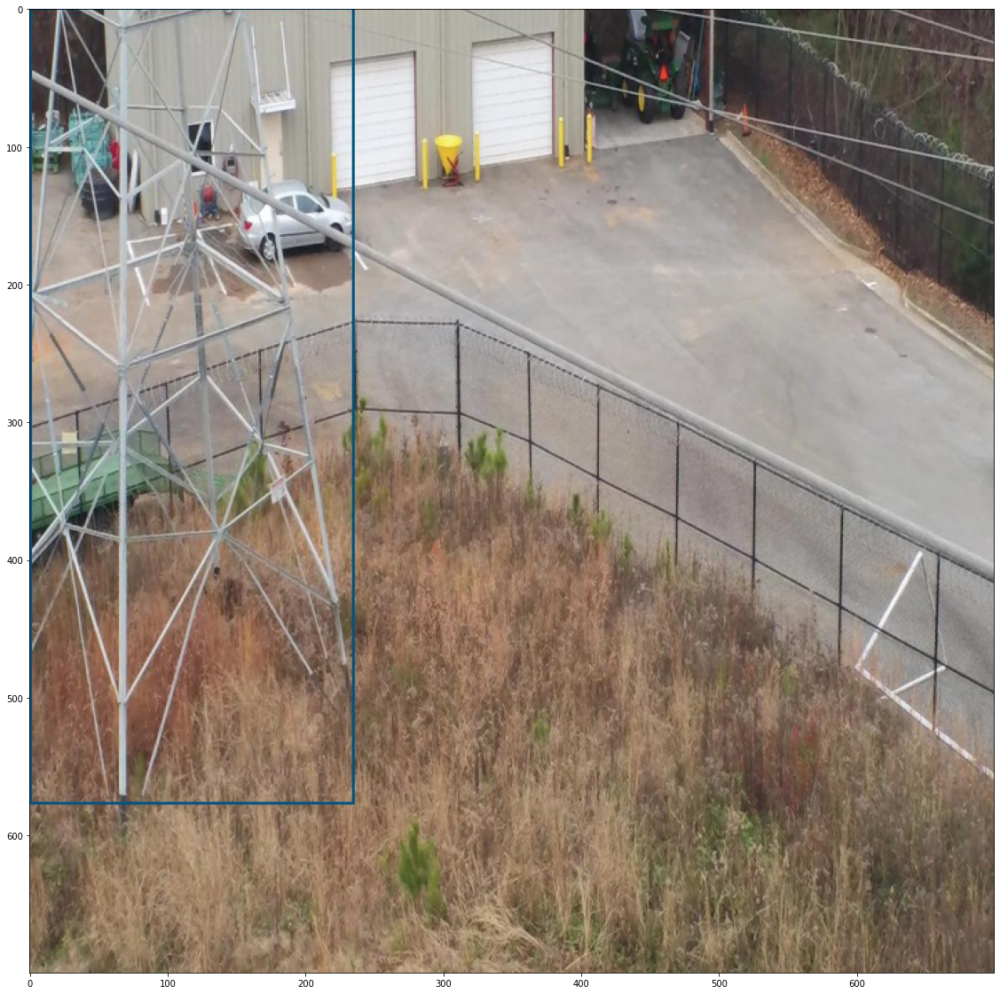

In [34]:
import matplotlib
import matplotlib.pyplot as plt
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(20, 20)
im = plt.imread('/content/PaddleDetection/output/34_00117.jpg')
plt.imshow(im)

In [23]:
!python tools/infer.py -c configs/ppyolo/ppyolov2_r50vd_dcn_365e_coco.yml -o use_gpu=True weights=/content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams --infer_img=/content/sized_data/08_1830.jpg --draw_threshold=0.5

/usr/local/lib/python3.7/dist-packages/IPython/utils/module_paths.py:29: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
W0927 10:58:00.495740  2099 device_context.cc:404] Please NOTE: device: 0, GPU Compute Capability: 3.7, Driver API Version: 11.2, Runtime API Version: 10.1
W0927 10:58:00.501693  2099 device_context.cc:422] device: 0, cuDNN Version: 7.6.
[09/27 10:58:04] ppdet.utils.checkpoint INFO: Finish loading model weights: /content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams
loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
[09/27 10:58:04] ppdet.engine INFO: Detection bbox results save in output/08_1830.jpg


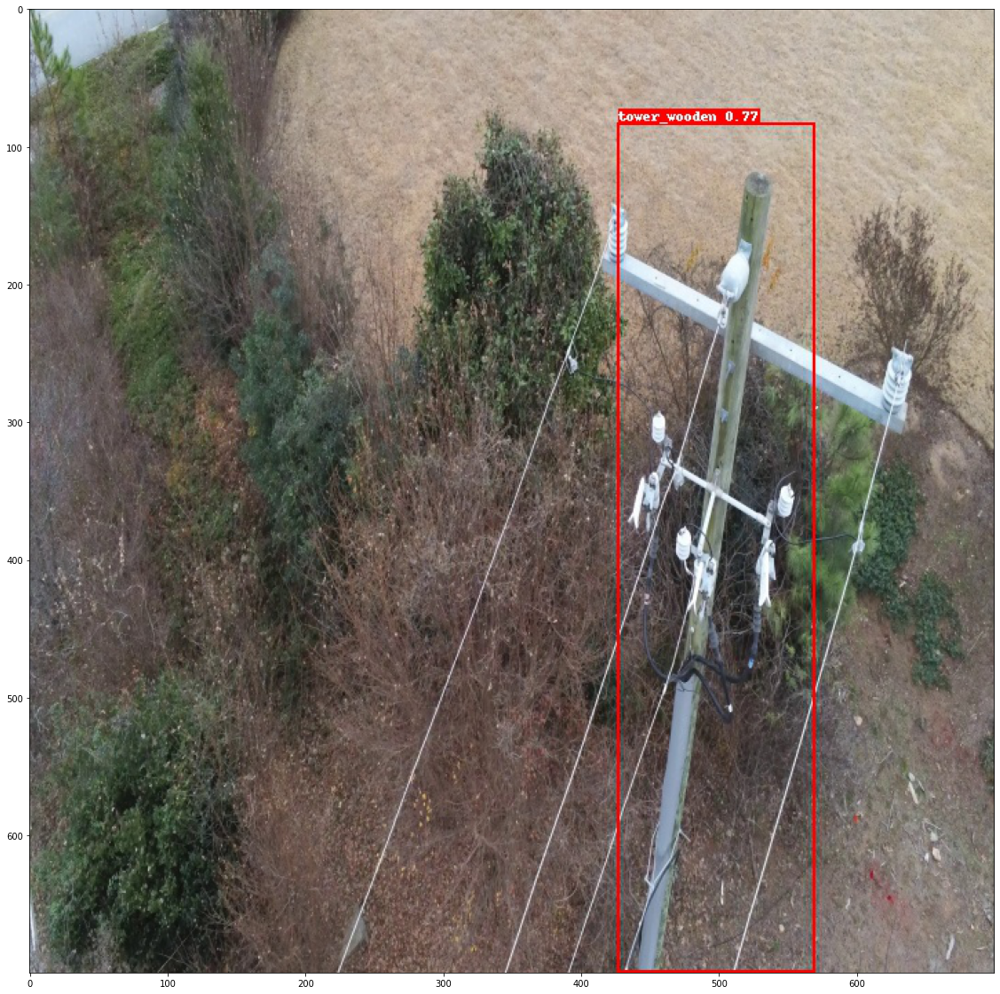

In [24]:
import matplotlib
import matplotlib.pyplot as plt
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(20, 20)
im = plt.imread('/content/PaddleDetection/output/08_1830.jpg')
plt.imshow(im)

In [25]:
%cd /content/
!wget https://img1.exportersindia.com/product_images/bc-full/dir_98/2926052/500kv-lattice-transmission-tower-1021656.jpg
!wget http://www.steeltowerchn.com/wp-content/uploads/2018/01/lattice-tower-1.jpg
!wget https://previews.123rf.com/images/vrabelpeter1/vrabelpeter11604/vrabelpeter1160400005/55458277-big-wooden-lookout-tower-distant-view-.jpg
!wget https://media.istockphoto.com/photos/wooden-observation-tower-in-a-natural-park-picture-id1135352400?s=612x612

/content
--2021-09-27 10:58:24--  https://img1.exportersindia.com/product_images/bc-full/dir_98/2926052/500kv-lattice-transmission-tower-1021656.jpg
Resolving img1.exportersindia.com (img1.exportersindia.com)... 13.224.163.31, 13.224.163.39, 13.224.163.72, ...
Connecting to img1.exportersindia.com (img1.exportersindia.com)|13.224.163.31|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 79851 (78K) [image/jpeg]
Saving to: ‘500kv-lattice-transmission-tower-1021656.jpg’

500kv-lattice-trans 100%[===================>]  77.98K  --.-KB/s    in 0.04s   

2021-09-27 10:58:24 (1.99 MB/s) - ‘500kv-lattice-transmission-tower-1021656.jpg’ saved [79851/79851]

--2021-09-27 10:58:24--  http://www.steeltowerchn.com/wp-content/uploads/2018/01/lattice-tower-1.jpg
Resolving www.steeltowerchn.com (www.steeltowerchn.com)... 97.64.81.206
Connecting to www.steeltowerchn.com (www.steeltowerchn.com)|97.64.81.206|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9

/content/PaddleDetection
/usr/local/lib/python3.7/dist-packages/IPython/utils/module_paths.py:29: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
W0927 11:00:38.940299  2192 device_context.cc:404] Please NOTE: device: 0, GPU Compute Capability: 3.7, Driver API Version: 11.2, Runtime API Version: 10.1
W0927 11:00:38.945492  2192 device_context.cc:422] device: 0, cuDNN Version: 7.6.
[09/27 11:00:43] ppdet.utils.checkpoint INFO: Finish loading model weights: /content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
[09/27 11:00:43] ppdet.engine INFO: Detection bbox results save in output/lattice-tower-1.jpg


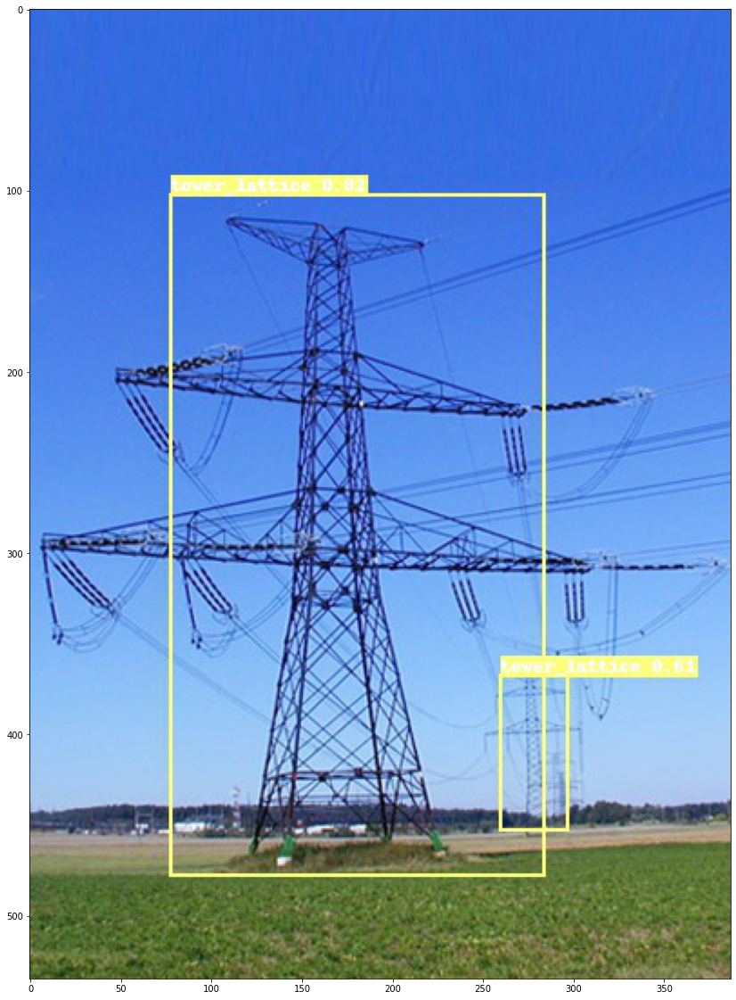

In [28]:
%cd /content/PaddleDetection/
!python tools/infer.py -c configs/ppyolo/ppyolov2_r50vd_dcn_365e_coco.yml -o use_gpu=True weights=/content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams --infer_img=/content/lattice-tower-1.jpg --draw_threshold=0.5

import matplotlib
import matplotlib.pyplot as plt
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(20, 20)
im = plt.imread('/content/PaddleDetection/output/lattice-tower-1.jpg')
plt.imshow(im)

/content/PaddleDetection
/usr/local/lib/python3.7/dist-packages/IPython/utils/module_paths.py:29: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
W0927 11:01:52.611645  2230 device_context.cc:404] Please NOTE: device: 0, GPU Compute Capability: 3.7, Driver API Version: 11.2, Runtime API Version: 10.1
W0927 11:01:52.619437  2230 device_context.cc:422] device: 0, cuDNN Version: 7.6.
[09/27 11:01:56] ppdet.utils.checkpoint INFO: Finish loading model weights: /content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
[09/27 11:01:57] ppdet.engine INFO: Detection bbox results save in output/demo.jpg


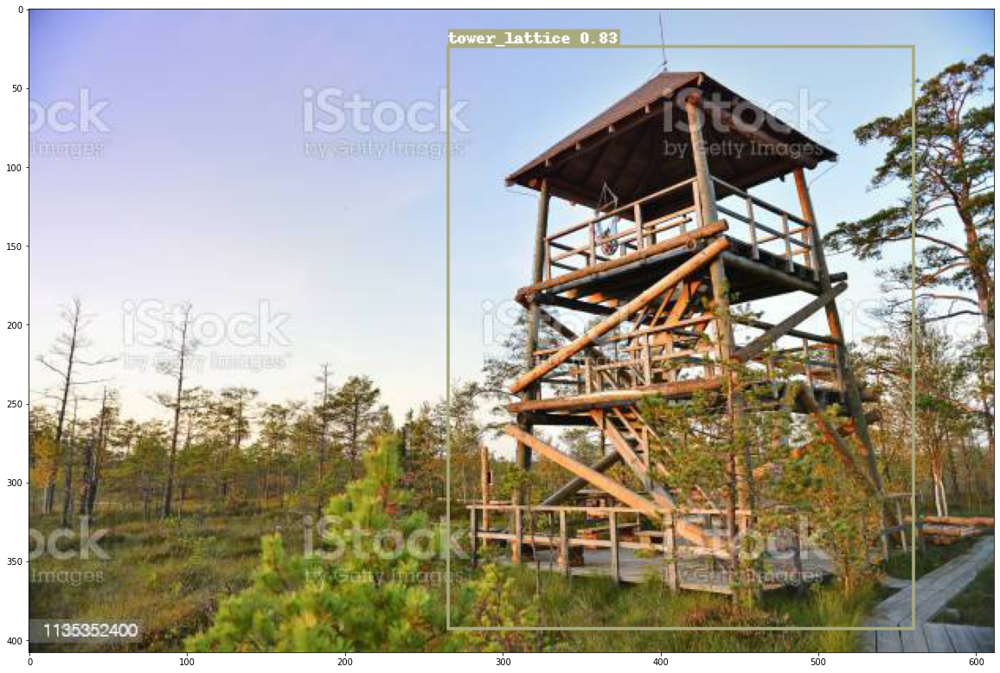

In [29]:
%cd /content/PaddleDetection/
!python tools/infer.py -c configs/ppyolo/ppyolov2_r50vd_dcn_365e_coco.yml -o use_gpu=True weights=/content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams --infer_img=/content/demo.jpg --draw_threshold=0.5

import matplotlib
import matplotlib.pyplot as plt
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(20, 20)
im = plt.imread('/content/PaddleDetection/output/demo.jpg')
plt.imshow(im)

/content/PaddleDetection
/usr/local/lib/python3.7/dist-packages/IPython/utils/module_paths.py:29: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
W0927 11:02:51.481673  2266 device_context.cc:404] Please NOTE: device: 0, GPU Compute Capability: 3.7, Driver API Version: 11.2, Runtime API Version: 10.1
W0927 11:02:51.490883  2266 device_context.cc:422] device: 0, cuDNN Version: 7.6.
[09/27 11:02:55] ppdet.utils.checkpoint INFO: Finish loading model weights: /content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams
loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
[09/27 11:02:55] ppdet.engine INFO: Detection bbox results save in output/55458277-big-wooden-lookout-tower-distant-view-.jpg


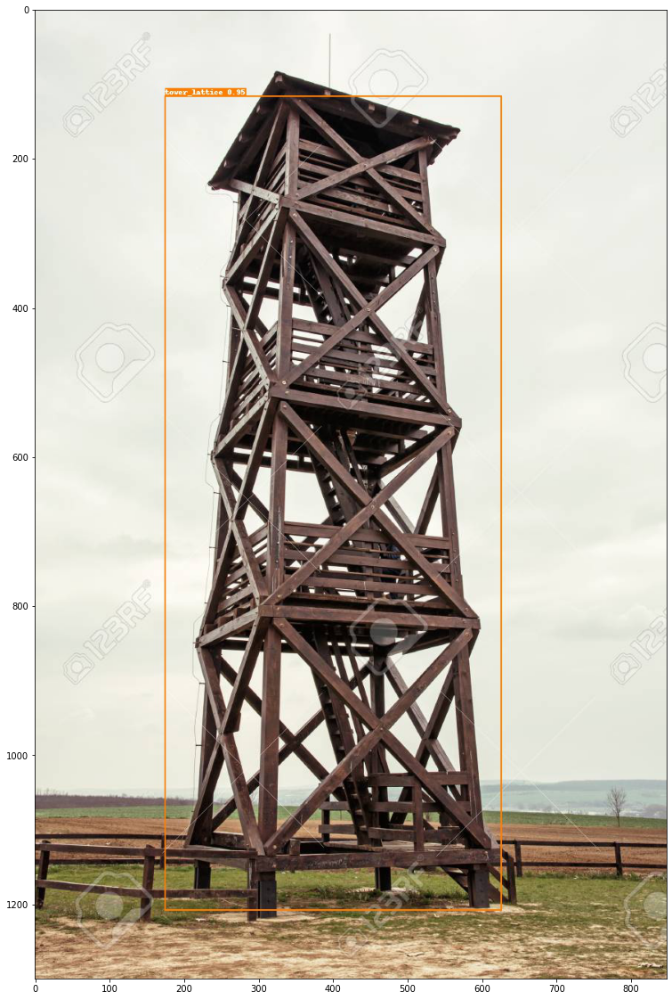

In [30]:
%cd /content/PaddleDetection/
!python tools/infer.py -c configs/ppyolo/ppyolov2_r50vd_dcn_365e_coco.yml -o use_gpu=True weights=/content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams --infer_img=/content/55458277-big-wooden-lookout-tower-distant-view-.jpg --draw_threshold=0.5

import matplotlib
import matplotlib.pyplot as plt
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(20, 20)
im = plt.imread('/content/PaddleDetection/output/55458277-big-wooden-lookout-tower-distant-view-.jpg')
plt.imshow(im)

/content/PaddleDetection
/usr/local/lib/python3.7/dist-packages/IPython/utils/module_paths.py:29: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
W0927 11:04:31.178025  2310 device_context.cc:404] Please NOTE: device: 0, GPU Compute Capability: 3.7, Driver API Version: 11.2, Runtime API Version: 10.1
W0927 11:04:31.182459  2310 device_context.cc:422] device: 0, cuDNN Version: 7.6.
[09/27 11:04:35] ppdet.utils.checkpoint INFO: Finish loading model weights: /content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
[09/27 11:04:35] ppdet.engine INFO: Detection bbox results save in output/500kv-lattice-transmission-tower-1021656.jpg


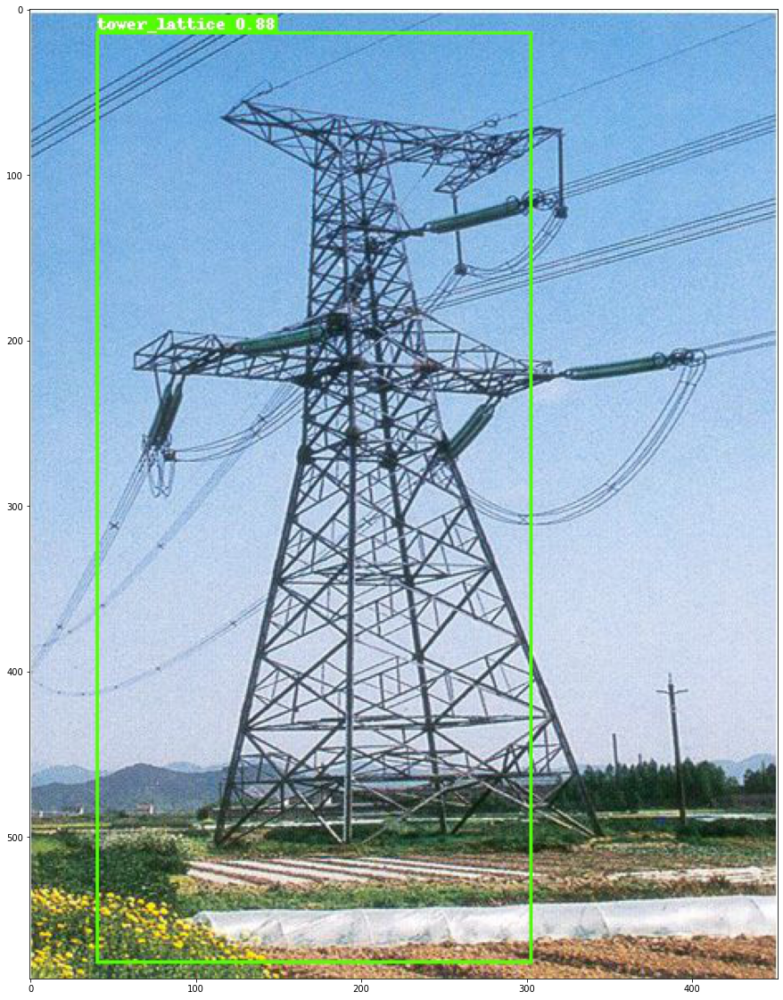

In [31]:
%cd /content/PaddleDetection/
!python tools/infer.py -c configs/ppyolo/ppyolov2_r50vd_dcn_365e_coco.yml -o use_gpu=True weights=/content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams --infer_img=/content/500kv-lattice-transmission-tower-1021656.jpg --draw_threshold=0.5

import matplotlib
import matplotlib.pyplot as plt
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(20, 20)
im = plt.imread('/content/PaddleDetection/output/500kv-lattice-transmission-tower-1021656.jpg')
plt.imshow(im)

/content/PaddleDetection
/usr/local/lib/python3.7/dist-packages/IPython/utils/module_paths.py:29: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
W0927 11:09:10.709614  2412 device_context.cc:404] Please NOTE: device: 0, GPU Compute Capability: 3.7, Driver API Version: 11.2, Runtime API Version: 10.1
W0927 11:09:10.714144  2412 device_context.cc:422] device: 0, cuDNN Version: 7.6.
[09/27 11:09:14] ppdet.utils.checkpoint INFO: Finish loading model weights: /content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
[09/27 11:09:15] ppdet.engine INFO: Detection bbox results save in output/34_1230.jpg


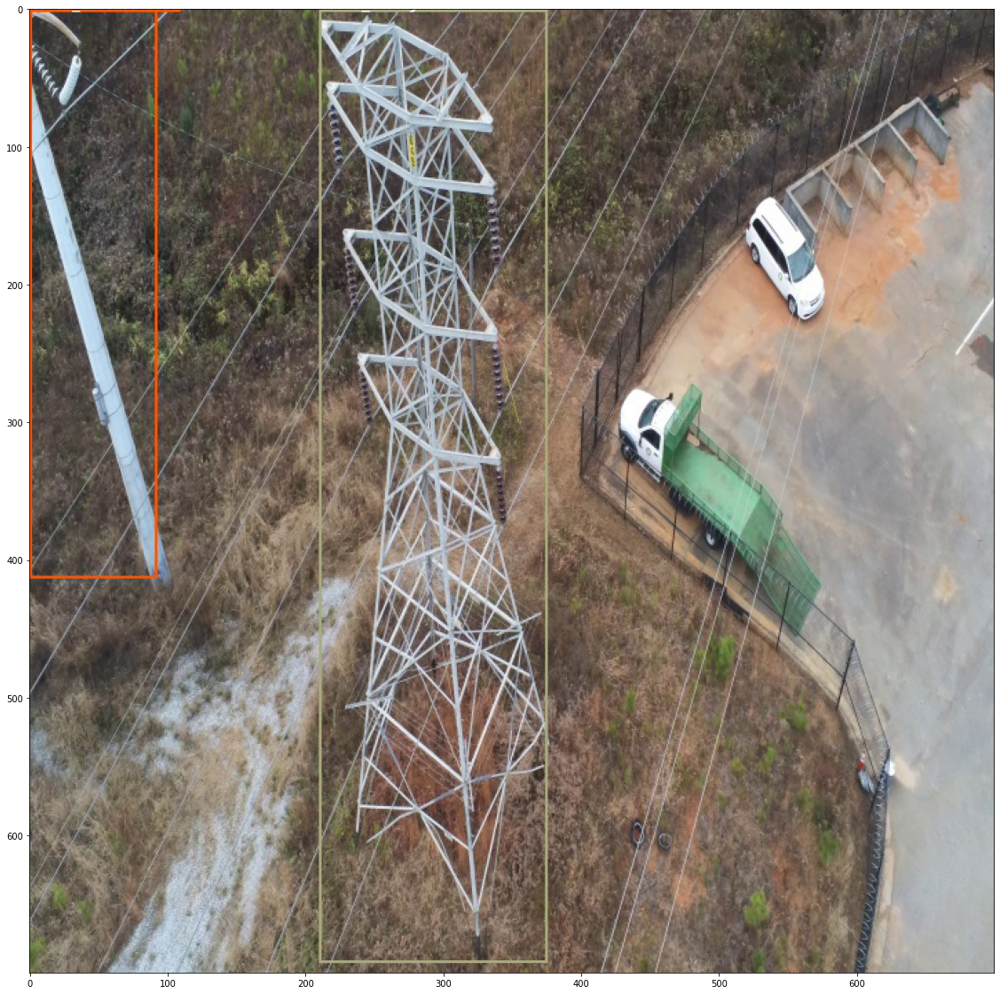

In [35]:
%cd /content/PaddleDetection/
!python tools/infer.py -c configs/ppyolo/ppyolov2_r50vd_dcn_365e_coco.yml -o use_gpu=True weights=/content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams --infer_img=/content/sized_data/34_1230.jpg --draw_threshold=0.5

import matplotlib
import matplotlib.pyplot as plt
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(20, 20)
im = plt.imread('/content/PaddleDetection/output/34_1230.jpg')
plt.imshow(im)

/content/PaddleDetection
/usr/local/lib/python3.7/dist-packages/IPython/utils/module_paths.py:29: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
W0927 11:13:35.334661  2530 device_context.cc:404] Please NOTE: device: 0, GPU Compute Capability: 3.7, Driver API Version: 11.2, Runtime API Version: 10.1
W0927 11:13:35.343127  2530 device_context.cc:422] device: 0, cuDNN Version: 7.6.
[09/27 11:13:39] ppdet.utils.checkpoint INFO: Finish loading model weights: /content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
[09/27 11:13:40] ppdet.engine INFO: Detection bbox results save in output/19_00413.jpg


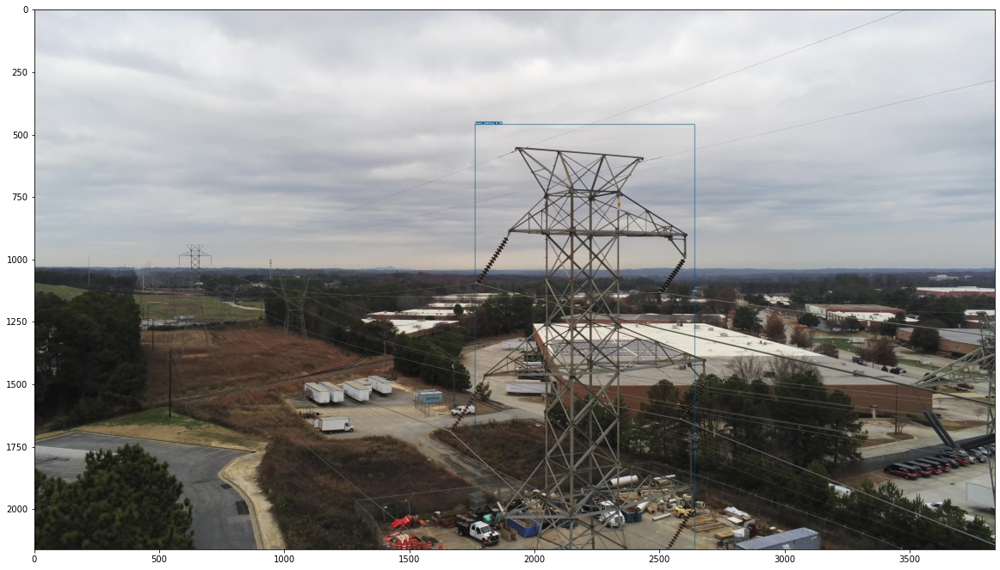

In [38]:
%cd /content/PaddleDetection/
!python tools/infer.py -c configs/ppyolo/ppyolov2_r50vd_dcn_365e_coco.yml -o use_gpu=True weights=/content/drive/MyDrive/22_Sept_TTPLA/ppyolov2_r50vd_dcn_365e_coco/model_final.pdparams --infer_img=/content/TTPLA_Images/19_00413.jpg --draw_threshold=0.5

import matplotlib
import matplotlib.pyplot as plt
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(20, 20)
im = plt.imread('/content/PaddleDetection/output/19_00413.jpg')
plt.imshow(im)